In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
  
%matplotlib inline

import seaborn as sns
import datetime
import warnings
from matplotlib import pyplot as plt
import numpy as np
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")

import pycountry
import plotly.express as px
import pandas as pd

#### Loading the dataset

In [64]:

df = pd.read_excel('CovidData.xlsx',skiprows=1,sheet_name='vaccinations-by-manufacturer-up')

In [65]:
df.head()

,Country,Date,Vaccine_Manufacturer,Total_Vaccinations,Severe Disease,Infection,Severe Disease.1,Infection.1,Severe Disease.2,Infection.2,Severe Disease.3,Infection.3,Severe Disease.4,Infection.4,Severe Disease.5,Infection.5
0,Argentina,2020-12-29,Oxford/AstraZeneca,1,0.94,0.63,0.94,0.63,0.94,0.69,0.94,0.69,0.94,0.69,0.71,0.36
1,Argentina,2020-12-29,Sinopharm/Beijing,1,0.73,0.68,0.73,0.68,0.71,0.67,0.71,0.67,0.71,0.67,0.53,0.35
2,Argentina,2020-12-29,Sputnik V,20488,18848.96,17619.68,18848.96,17619.68,18234.32,17414.80,18234.32,17414.80,18234.32,17414.80,11268.40,7375.68
3,Argentina,2020-12-30,Sputnik V,40590,37342.80,34907.40,37342.80,34907.40,36125.10,34501.50,36125.10,34501.50,36125.10,34501.50,22324.50,14612.40
4,Argentina,2020-12-31,Sputnik V,43396,39924.32,37320.56,39924.32,37320.56,38622.44,36886.60,38622.44,36886.60,38622.44,36886.60,23867.80,15622.56


#### Dropping the Ancestral,Gamma & Delta 

In [66]:
df.drop(columns=['Severe Disease', 'Infection', 'Severe Disease.3', 'Infection.3',
       'Severe Disease.4', 'Infection.4'], inplace=True, axis=1)

#### Printing the columns names

In [67]:
df.columns

Index(['Country', 'Date', 'Vaccine_Manufacturer', 'Total_Vaccinations',
       'Severe Disease.1', 'Infection.1', 'Severe Disease.2', 'Infection.2',
       'Severe Disease.5', 'Infection.5'],
      dtype='object')

#### Renaming columns names

In [68]:
df.rename({'Severe Disease.1': 'ancestral_alpha_severe', 'Infection.1': 'ancestral_alpha_infection',
                'Severe Disease.2': 'beta_gamma_delta_severe'  , 'Infection.2': 'beta_gamma_delta_infection',
                'Severe Disease.5':'omicron_severe', 'Infection.5':'omicron_infection'}, axis=1, inplace=True)  # new method     

In [69]:
df.columns

Index(['Country', 'Date', 'Vaccine_Manufacturer', 'Total_Vaccinations',
       'ancestral_alpha_severe', 'ancestral_alpha_infection',
       'beta_gamma_delta_severe', 'beta_gamma_delta_infection',
       'omicron_severe', 'omicron_infection'],
      dtype='object')

#### Changing datatype of columns from float to Integers

In [70]:
#Change the data type of features
df.ancestral_alpha_severe = df.ancestral_alpha_severe.astype(int)
df.ancestral_alpha_infection = df.ancestral_alpha_infection.astype(int)
df.beta_gamma_delta_severe = df.beta_gamma_delta_severe.astype(int)
df.beta_gamma_delta_infection = df.beta_gamma_delta_infection.astype(int)
df.omicron_severe = df.omicron_severe.astype(int)
df.omicron_infection =df.omicron_infection.astype(int)

#### Dropping NA values if any exists

In [71]:
df

,Country,Date,Vaccine_Manufacturer,Total_Vaccinations,ancestral_alpha_severe,ancestral_alpha_infection,beta_gamma_delta_severe,beta_gamma_delta_infection,omicron_severe,omicron_infection
0,Argentina,2020-12-29,Oxford/AstraZeneca,1,0,0,0,0,0,0
1,Argentina,2020-12-29,Sinopharm/Beijing,1,0,0,0,0,0,0
2,Argentina,2020-12-29,Sputnik V,20488,18848,17619,18234,17414,11268,7375
3,Argentina,2020-12-30,Sputnik V,40590,37342,34907,36125,34501,22324,14612
4,Argentina,2020-12-31,Sputnik V,43396,39924,37320,38622,36886,23867,15622
...,...,...,...,...,...,...,...,...,...,...
48145,European Union,2022-10-17,Pfizer/BioNTech,633735112,602048356,545012196,602048356,532337494,456289280,0
48146,European Union,2022-10-17,Sinopharm/Beijing,2317509,1691781,1575906,1645431,1552731,1228279,811128
48147,European Union,2022-10-17,Sinovac,6772,3386,3182,3318,3115,2505,1625
48148,European Union,2022-10-17,Sputnik V,1845376,1697745,1587023,1642384,1568569,1014956,664335


In [72]:
# Counting missing value
df.isnull().sum()


Country                       0
Date                          0
Vaccine_Manufacturer          0
Total_Vaccinations            0
ancestral_alpha_severe        0
ancestral_alpha_infection     0
beta_gamma_delta_severe       0
beta_gamma_delta_infection    0
omicron_severe                0
omicron_infection             0
dtype: int64

In [73]:
df.dropna(inplace=True)

In [74]:
df['Vaccine_Manufacturer'].unique()

array(['Oxford/AstraZeneca', 'Sinopharm/Beijing', 'Sputnik V',
       'Pfizer/BioNTech', 'CanSino', 'Moderna', 'Johnson&Johnson',
       'Novavax', 'Valneva', 'Medicago', 'Sinovac', 'Covaxin',
       'SKYCovione'], dtype=object)

In [75]:
#dropping european Union
df = df[df.Country != 'European Union']

In [76]:
df.shape

(41550, 10)

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41550 entries, 0 to 41549
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Country                     41550 non-null  object        
 1   Date                        41550 non-null  datetime64[ns]
 2   Vaccine_Manufacturer        41550 non-null  object        
 3   Total_Vaccinations          41550 non-null  int64         
 4   ancestral_alpha_severe      41550 non-null  int32         
 5   ancestral_alpha_infection   41550 non-null  int32         
 6   beta_gamma_delta_severe     41550 non-null  int32         
 7   beta_gamma_delta_infection  41550 non-null  int32         
 8   omicron_severe              41550 non-null  int32         
 9   omicron_infection           41550 non-null  int32         
dtypes: datetime64[ns](1), int32(6), int64(1), object(2)
memory usage: 2.5+ MB


In [78]:
Vaccine_Manufacturer =df.groupby("Vaccine_Manufacturer")["Country"].nunique()
Country_wise_count = Vaccine_Manufacturer.to_frame().reset_index()

In [79]:
import plotly.express as px
fig = px.bar(Country_wise_count, y='Country', x='Vaccine_Manufacturer', color = 'Vaccine_Manufacturer',
             color_discrete_sequence= px.colors.sequential.Plasma, title="Vaccine Manufacturer Count -Country Wise")
fig.show()


In [80]:
df1_grouped = df.groupby('Vaccine_Manufacturer')
for group_name, df_group in df1_grouped:
    vaccine_group = df1_grouped.get_group(group_name)
    
    list_countries = vaccine_group['Country'].unique().tolist()
    country_cnt = len(vaccine_group['Country'].unique())
    d_country_code = {}
    for country in list_countries:
        try:
            country_data = pycountry.countries.search_fuzzy(country)
            country_code = country_data[0].alpha_3
            d_country_code.update({country: country_code})
        except:
            print('could not add ISO 3 code for ->', country)
            d_country_code.update({country: ' '})

    for k, v in d_country_code.items():
        vaccine_group.loc[(vaccine_group.Country == k), 'iso_alpha'] = v
        
    fig = make_subplots(rows=3, cols=4, start_cell="bottom-left")

        
    fig = px.choropleth(data_frame = vaccine_group,
                    locations= "iso_alpha",
                    color= "Country",
                    color_continuous_scale= px.colors.sequential.Inferno,
                    hover_name= "Vaccine_Manufacturer")
    fig.update_layout(
        title_text = "Countries {}".format(country_cnt))


    fig.show()

### Tree Map

In [81]:
vaccine_count = df.groupby("Vaccine_Manufacturer")["Country"].nunique()
Vaccine_Manufacturer_count = pd.DataFrame({'Vaccine_Manufacturer':vaccine_count.index, 'Count':vaccine_count.values})

In [82]:
import plotly.express as px
fig = px.treemap(
    Vaccine_Manufacturer_count, path = ["Vaccine_Manufacturer", "Count"], values = "Count")
fig.update_traces(root_color="royalblue")
fig.show()


### Pie Chart

In [83]:
# plotting a pie plot for diffrent kind of vaccines
def plot_pie(value, title, color) : 
    new_dict = {}
    for v in df[value].unique() : 
        value_count = 0
        for i in range(len(df)) : 
            if df[value][i] == v : 
                value_count += 1 
        new_dict[v] = value_count 
#     print(new_dict)
    new_df = pd.DataFrame.from_dict(new_dict, orient = 'index', columns = ['Total'])
    if color == 'plasma' : 
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title,
                     color_discrete_sequence=px.colors.sequential.Plasma)
    elif color == 'rainbow' : 
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title,
                     color_discrete_sequence=px.colors.sequential.Rainbow)
    else :
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title)
    fig.update_layout(
        title={
            'y':0.95,
            'x':0.5
        },
        legend_title = value
    )
    return fig.show()
    
plot_pie('Vaccine_Manufacturer', 'Various vaccines and their uses', 'plasma')

### Words Counts

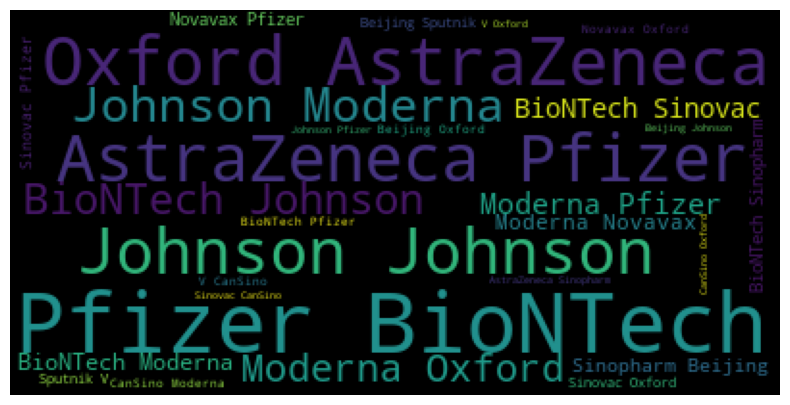

In [84]:
# Word art of vaccines
from wordcloud import WordCloud
wordCloud = WordCloud(
    background_color='black',
    max_font_size = 50).generate(' '.join(df.Vaccine_Manufacturer))
plt.figure(figsize=(12,5))
plt.axis('off')
plt.imshow(wordCloud)
plt.show()

### Bubble Chart For Vaccine

In [85]:
total = df.groupby(['Country','Vaccine_Manufacturer'])["Total_Vaccinations"].sum().rename("Total_sum").reset_index()
df_1 = df.merge(total)
gk_1 = df_1.groupby('Vaccine_Manufacturer')
for group_name, df_group in df1_grouped:
    
    Oxford = gk_1.get_group(group_name)
    fig = px.scatter(Oxford, x = 'Country', y = 'Total_sum', size = 'Total_sum', color = "Country",
                hover_name="Vaccine_Manufacturer",size_max=70, title="Vaccine- "+group_name)

    fig.show()


#### Scatter Plot

In [86]:
for col in df.columns[4:]:
    total = df.groupby(['Country','Vaccine_Manufacturer'])[col].sum().rename(col).reset_index()
    fig = px.scatter(total, x="Country", y=col, color='Vaccine_Manufacturer', size=col, hover_data=['Vaccine_Manufacturer'], title=col)
    fig.show()

In [87]:
fig = px.line (data_frame = df, x = df.index, y = 'Total_Vaccinations', color = 'Country', 
               color_discrete_sequence=px.colors.qualitative.Plotly, line_dash = 'Country', 
               labels = {'Vaccination': 'Total_Vaccinations', 'date':'Date'}, title = 'Covid Vaccination')

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_traces(hovertemplate=None)
fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                  hovermode="x unified", 
                  xaxis_title=' ', yaxis_title=" ",
                  plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                  title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'))
fig.show()

In [88]:
#Evolution of the vccination around the months, by country.
fig = px.density_heatmap(df, y='Country', x='Date', z='Total_Vaccinations',
                         title='Total vaccination')
fig.update_yaxes(showgrid=False, categoryorder='total ascending', ticksuffix=' ', showline=False)
fig.update_layout(xaxis_title=' ', yaxis_title=" ",
                  plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                  title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'))
fig.show()

In [89]:
### Country 

In [90]:
# total vaccination USA vs Canada
canada_usa = [df[df.Country == 'United States'], df[df.Country == 'Canada']]
result = pd.concat(canada_usa)
fig = px.line(result, x = 'Date', y ='Total_Vaccinations', color = 'Country')
fig.update_layout(
    title={
            'text' : "Total vaccinated - Canada vs USA",
            'y':0.95,
            'x':0.5
        },
    xaxis_title="Date",
    yaxis_title="Total Vaccinations"
)
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_traces(hovertemplate=None)
fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                  hovermode="x unified", 
                  xaxis_title=' ', yaxis_title=" ",
                  plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                  title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'))
fig.show()

In [91]:
#Years Columns
df['year'] = df['Date'].dt.year

In [92]:
df3=pd.DataFrame(df.groupby(['Country','Vaccine_Manufacturer','year'])["Total_Vaccinations"].sum().rename("Total_sum").reset_index())

In [93]:
#Taking Max count of each vaccine manufacturer
df['Vaccine_Wise_Max_Total_Vaccination']=df.groupby(['Country','Vaccine_Manufacturer'])['Total_Vaccinations'].transform(max)


In [94]:
#precentage count logic
l1= list(df['Country'].unique())
for i in l1:
    df.loc[df['Country']==i, 'Total_Vaccination_Country_Wise'] = sum(list(df[df['Country']== i]['Vaccine_Wise_Max_Total_Vaccination'].unique()))

In [95]:
# Percentage of Vaccine
df['Percentage_of_Vaccine'] =df['Vaccine_Wise_Max_Total_Vaccination']/df['Total_Vaccination_Country_Wise']

In [96]:
l1= list(df['Country'].unique())

for i in l1:

    df.loc[df['Country']==i, 'Total_Vaccination_Country_Wise'] = sum(list(df[df['Country']== i]['Vaccine_Wise_Max_Total_Vaccination'].unique()))

In [97]:
#Saving CSV Files\
df.to_csv("dfFirst.csv")

### Efficacy Data

In [98]:
#Reading Efficacy Data
efficay_df = pd.read_excel('CovidData.xlsx',skiprows=1,sheet_name='Sheet1')
efficay_df.dropna(inplace=True)
efficay_df.drop(['Ancestral', 'Ancestral.1','Gamma', 'Gamma.1', 'delta', 'Delta'], inplace=True, axis=1)

### Rename Columns Names

In [99]:

efficay_df.rename({'Unnamed: 0': "Vaccine_Manufacturers_", 'Alpha': 'ancestral_alpha_severe_', 'Alpha.1' :'ancestral_alpha_infection_', 'Beta':  'beta_gamma_delta_severe_' , 
           'Beta.1': 'beta_gamma_delta_infection_', 'Omicron':'omicron_severe_',
       'Omicron.1':'omicron_infection_'}, axis=1, inplace=True)     

In [100]:
efficay_df['Vaccine_Manufacturers_'].replace({'Medicago***': 'Medicago', 'Valneva**': 'Valneva', 'Sinovac/Coronavac':'Sinovac'},inplace=True)

In [101]:
df1=df.copy()

In [102]:
abc=efficay_df[['Vaccine_Manufacturers_',  'ancestral_alpha_severe_', 'ancestral_alpha_infection_',
       'beta_gamma_delta_severe_', 'beta_gamma_delta_infection_', 'omicron_severe_',
       'omicron_infection_']]

In [103]:
df1=df1.merge(abc,left_on='Vaccine_Manufacturer',right_on='Vaccine_Manufacturers_')

In [104]:
efficacy=['ancestral_alpha_severe_', 'ancestral_alpha_infection_',
       'beta_gamma_delta_severe_', 'beta_gamma_delta_infection_', 'omicron_severe_',
       'omicron_infection_']

for i in efficacy:
    df1['efficacy_'+str(i)] = round (df1[i] * df1['Percentage_of_Vaccine'],2)

In [105]:
#dropping unwanted data
df1.drop(['ancestral_alpha_severe_', 'ancestral_alpha_infection_',
       'beta_gamma_delta_severe_', 'beta_gamma_delta_infection_', 'omicron_severe_',
       'omicron_infection_'], inplace=True, axis=1)

In [106]:
#Calculating break Through 

efficacy_col=['efficacy_ancestral_alpha_severe_',
       'efficacy_ancestral_alpha_infection_',
       'efficacy_beta_gamma_delta_severe_',
       'efficacy_beta_gamma_delta_infection_', 'efficacy_omicron_severe_',
       'efficacy_omicron_infection_']

for i in efficacy_col:
    df1['breakThrough_'+str(i[9:])] = round((100 -  df1[i]), 2)

### Efficacy graph

In [107]:

country_df = pd.read_excel('CovidData.xlsx',sheet_name='Sheet2')

In [108]:
df1=df1.merge(country_df,left_on='Country',right_on='Country')

In [109]:
for col in df1.columns[15:21]:
    total = df1.groupby(['Country','Vaccine_Manufacturer'])[col].sum().rename(col).reset_index()
    fig = px.scatter(total, x="Country", y=col, color='Vaccine_Manufacturer', size=col, hover_data=['Vaccine_Manufacturer'], title=col)
    fig.show()

In [110]:
df3=df1.groupby(['Country','Vaccine_Manufacturer'])
df3 =df3.first()
df3 = df3.reset_index()

In [111]:
df3.to_csv("df3.csv")

In [112]:
for col in df3.columns[15:21]:
    print(col)
    fig = px.bar(df3, y="Country", x=col,color='Vaccine_Manufacturer', title="efficacy With Respect Variant",orientation='h', width=800, height=900, text=col )

    fig.show()

efficacy_ancestral_alpha_severe_


efficacy_ancestral_alpha_infection_


efficacy_beta_gamma_delta_severe_


efficacy_beta_gamma_delta_infection_


efficacy_omicron_severe_


efficacy_omicron_infection_


In [113]:
for col in df3.columns[21:27]:
    print(col)
    fig = px.bar(df3, y="Country", x=col,color='Vaccine_Manufacturer', title="Breakthrough With Respect to Variant",orientation='h', width=800, height=900, text=col )
    fig.show()

breakThrough_ancestral_alpha_severe_


breakThrough_ancestral_alpha_infection_


breakThrough_beta_gamma_delta_severe_


breakThrough_beta_gamma_delta_infection_


breakThrough_omicron_severe_


breakThrough_omicron_infection_


In [114]:
fig = px.bar(df3, x="Country", y="Vaccine_Wise_Max_Total_Vaccination", color="Vaccine_Manufacturer", title="Total Vaccination With Respect to Country and Manufacturer", width=800, height=800)
fig.show()

In [115]:
pop_col=['pop_20', 'pop_21', 'pop_22']

for i in pop_col:
    df3['vaccinated_'+str(i)] = round(((df3[i])/(df3['Vaccine_Wise_Max_Total_Vaccination'])), 2)

In [116]:
df3

,Country,Vaccine_Manufacturer,Date,Total_Vaccinations,ancestral_alpha_severe,ancestral_alpha_infection,beta_gamma_delta_severe,beta_gamma_delta_infection,omicron_severe,omicron_infection,...,breakThrough_beta_gamma_delta_severe_,breakThrough_beta_gamma_delta_infection_,breakThrough_omicron_severe_,breakThrough_omicron_infection_,pop_20,pop_21,pop_22,vaccinated_pop_20,vaccinated_pop_21,vaccinated_pop_22
0,Argentina,CanSino,2021-02-05,2,1,1,1,1,0,0,...,99.43,99.46,99.57,99.71,45036032,45276780,45510318,45.97,46.21,46.45
1,Argentina,Moderna,2021-02-25,56,54,51,54,50,40,26,...,88.29,89.01,91.19,94.20,45036032,45276780,45510318,3.40,3.42,3.43
2,Argentina,Oxford/AstraZeneca,2020-12-29,1,0,0,0,0,0,0,...,77.08,83.18,82.69,91.22,45036032,45276780,45510318,1.68,1.69,1.70
3,Argentina,Pfizer/BioNTech,2021-01-02,1,0,0,0,0,0,0,...,83.44,85.35,87.45,92.33,45036032,45276780,45510318,2.35,2.37,2.38
4,Argentina,Sinopharm/Beijing,2020-12-29,1,0,0,0,0,0,0,...,81.32,82.37,86.05,90.79,45036032,45276780,45510318,1.56,1.57,1.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,United States,Moderna,2021-01-12,3835859,3720783,3528990,3720783,3490631,2800177,1841212,...,63.53,65.79,72.56,81.96,335942003,336997624,338289857,1.42,1.43,1.43
202,United States,Pfizer/BioNTech,2021-01-12,5488697,5214262,4720279,5214262,4610505,3951861,2415026,...,43.58,50.11,57.24,73.87,335942003,336997624,338289857,0.90,0.90,0.91
203,Uruguay,Oxford/AstraZeneca,2021-02-27,5,4,3,4,3,3,1,...,98.55,98.93,98.90,99.44,3429086,3426260,3422794,37.62,37.59,37.55
204,Uruguay,Pfizer/BioNTech,2021-02-27,6,5,5,5,5,4,2,...,58.81,63.58,68.78,80.92,3429086,3426260,3422794,1.34,1.34,1.34


In [117]:
df3 =df3[(df3['vaccinated_pop_20']<100) & (df3['vaccinated_pop_21']<100) & (df3['vaccinated_pop_22']<100)]
df4=df3.groupby(['Country','year'])['Vaccine_Manufacturer','vaccinated_pop_20','vaccinated_pop_21','vaccinated_pop_22']
df4=df4.first().reset_index()


In [118]:
df4.to_csv("df4.csv")

In [119]:
for col in df4.columns[3:]:
    print(col)
    total = df4.groupby(['Country'])[col].sum().rename(col).reset_index()
    total= total.round(2)
    fig = px.bar(total, y="Country", x=col,title="Percentage of Vaccination" , width=1200, height=1200, text=col ,orientation='h')

    fig.show()

vaccinated_pop_20


vaccinated_pop_21


vaccinated_pop_22


In [120]:
total = df.groupby(['Country','Vaccine_Manufacturer'])['Vaccine_Wise_Max_Total_Vaccination']
total= total.first()
total= total.reset_index()
total=total.groupby('Vaccine_Manufacturer')
group_name = 'Pfizer/BioNTech'
Oxford = total.get_group(group_name)
fig = px.scatter(Oxford, x = 'Country', y = 'Vaccine_Wise_Max_Total_Vaccination', size = 'Vaccine_Wise_Max_Total_Vaccination', color = "Country",
            hover_name="Vaccine_Manufacturer",size_max=70, title="Vaccine- "+group_name)

fig.show()